In [1]:
import pandas as pd                 
import numpy as np                  
import statsmodels.api as sm        
import seaborn as sns               
import matplotlib.pyplot as plt

import statsmodels.formula.api as sm

from sklearn import metrics
from sklearn.svm import SVC
import warnings
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

from sklearn import metrics
from sklearn.linear_model import LogisticRegression

from sklearn.metrics import (accuracy_score,confusion_matrix,recall_score,
precision_score,f1_score)

import warnings
warnings.filterwarnings("ignore")

# Problem Statement

Businesses or companies can fall prey to default if they are not able to keep up their debt obligations. Defaults will lead to a lower credit rating for the company which in turn reduces its chances of getting credit in the future and may have to pay higher interests on existing debts as well as any new obligations. From an investor's point of view, he would want to invest in a company if it is capable of handling its financial obligations, can grow quickly, and is able to manage the growth scale.

A balance sheet is a financial statement of a company that provides a snapshot of what a company owns, owes, and the amount invested by the shareholders. Thus, it is an important tool that helps evaluate the performance of a business.

Data that is available includes information from the financial statement of the companies for the previous year (2015). Also, information about the Networth of the company in the following year (2016) is provided which can be used to drive the labeled field.

## Importing the dataset

In [2]:
data = pd.read_excel("Company_Data2015-1.xlsx")

In [42]:
data.head()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,...,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,...,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,...,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,...,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,...,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05


In [163]:
data.tail()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
3581,4987,HDFC Bank,72677.77,501.30,62009.42,590576.00,496009.19,8463.30,0.00,444633.50,...,0.00,0.00,0.00,0.00,0.00,0,0,NaN,0.60,7.76
3582,502,Vedanta,79162.19,296.50,34057.87,71906.06,37643.79,29848.44,2503.86,11554.45,...,39.92,32.17,29.81,30.52,22.77,13,53,77.0,0.29,1.00
3583,12002,I O C L,88134.31,2427.95,67969.97,140686.75,55245.01,121643.45,6376.84,89609.82,...,8.09,6.69,7.31,5.69,4.29,7,30,48.0,1.42,3.24
3584,12001,NTPC,91293.70,8245.46,81657.35,173099.14,85995.34,128477.59,11449.79,42353.59,...,28.12,20.55,23.39,19.55,11.99,32,69,42.0,0.36,0.68
3585,15542,Bharti Airtel,111729.10,1998.70,78270.80,104241.00,21569.70,100084.90,-12145.30,11947.10,...,42.47,22.88,34.04,25.97,6.37,18,74,0.0,0.42,0.49


In [142]:
data.shape

(3586, 67)

In [143]:
data.columns

Index(['Co_Code', 'Co_Name', 'Networth Next Year', 'Equity Paid Up',
       'Networth', 'Capital Employed', 'Total Debt', 'Gross Block ',
       'Net Working Capital ', 'Current Assets ',
       'Current Liabilities and Provisions ', 'Total Assets/Liabilities ',
       'Gross Sales', 'Net Sales', 'Other Income', 'Value Of Output',
       'Cost of Production', 'Selling Cost', 'PBIDT', 'PBDT', 'PBIT', 'PBT',
       'PAT', 'Adjusted PAT', 'CP', 'Revenue earnings in forex',
       'Revenue expenses in forex', 'Capital expenses in forex',
       'Book Value (Unit Curr)', 'Book Value (Adj.) (Unit Curr)',
       'Market Capitalisation', 'CEPS (annualised) (Unit Curr)',
       'Cash Flow From Operating Activities',
       'Cash Flow From Investing Activities',
       'Cash Flow From Financing Activities', 'ROG-Net Worth (%)',
       'ROG-Capital Employed (%)', 'ROG-Gross Block (%)',
       'ROG-Gross Sales (%)', 'ROG-Net Sales (%)',
       'ROG-Cost of Production (%)', 'ROG-Total Assets (%)', 

In [144]:
print("no. of rows: ",data.shape[0], "\n""no. of columns: ",data.shape[1])

no. of rows:  3586 
no. of columns:  67


In [145]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3586 entries, 0 to 3585
Data columns (total 67 columns):
Co_Code                                3586 non-null int64
Co_Name                                3586 non-null object
Networth Next Year                     3586 non-null float64
Equity Paid Up                         3586 non-null float64
Networth                               3586 non-null float64
Capital Employed                       3586 non-null float64
Total Debt                             3586 non-null float64
Gross Block                            3586 non-null float64
Net Working Capital                    3586 non-null float64
Current Assets                         3586 non-null float64
Current Liabilities and Provisions     3586 non-null float64
Total Assets/Liabilities               3586 non-null float64
Gross Sales                            3586 non-null float64
Net Sales                              3586 non-null float64
Other Income                           358

In [146]:
duplicates = data.duplicated()
print('Number of duplicate rows = %d' % (duplicates.sum()))
data[duplicates]

Number of duplicate rows = 0


,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block


In [44]:
pd.set_option('max_rows', None)
data.isnull().sum()

Co_Code                                  0
Co_Name                                  0
Networth Next Year                       0
Equity Paid Up                           0
Networth                                 0
Capital Employed                         0
Total Debt                               0
Gross Block                              0
Net Working Capital                      0
Current Assets                           0
Current Liabilities and Provisions       0
Total Assets/Liabilities                 0
Gross Sales                              0
Net Sales                                0
Other Income                             0
Value Of Output                          0
Cost of Production                       0
Selling Cost                             0
PBIDT                                    0
PBDT                                     0
PBIT                                     0
PBT                                      0
PAT                                      0
Adjusted PA

In [3]:
data.isnull().sum().sum()

118

In [4]:
data[data['Current Ratio[Latest]'].isnull()].index.tolist()


[2825]

In [5]:
data['Current Ratio[Latest]'].isnull().sum()

1

In [6]:
data.drop(2825,inplace=True)

In [7]:
data.loc[:, data.isnull().any()].columns

Index(['Book Value (Adj.) (Unit Curr)', 'Inventory Velocity (Days)'], dtype='object')

In [8]:
data[data['Book Value (Adj.) (Unit Curr)'].isnull()].index.tolist()

[318, 1516, 2455, 2717]

In [9]:
data.drop(318,inplace=True)
data.drop(1516,inplace=True)
data.drop(2455,inplace=True)
data.drop(2717,inplace=True)

In [10]:
data[data['Book Value (Adj.) (Unit Curr)'].isnull()].index.tolist()

[]

In [11]:
data = data.drop(['Inventory Velocity (Days)'], axis = 1)

In [12]:
data.loc[:, data.isnull().any()].columns

Index([], dtype='object')

In [13]:
data.shape

(3581, 66)

In [14]:
data.isnull().sum().sum()

0

In [158]:
data.head()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,...,Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,...,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,...,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,...,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,...,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,...,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.01,0.05


In [159]:
data.tail()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,...,Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
3581,4987,HDFC Bank,72677.77,501.30,62009.42,590576.00,496009.19,8463.30,0.00,444633.50,...,0.00,0.00,0.00,0.00,0.00,0.00,0,0,0.60,7.76
3582,502,Vedanta,79162.19,296.50,34057.87,71906.06,37643.79,29848.44,2503.86,11554.45,...,3.18,39.92,32.17,29.81,30.52,22.77,13,53,0.29,1.00
3583,12002,I O C L,88134.31,2427.95,67969.97,140686.75,55245.01,121643.45,6376.84,89609.82,...,8.60,8.09,6.69,7.31,5.69,4.29,7,30,1.42,3.24
3584,12001,NTPC,91293.70,8245.46,81657.35,173099.14,85995.34,128477.59,11449.79,42353.59,...,4.35,28.12,20.55,23.39,19.55,11.99,32,69,0.36,0.68
3585,15542,Bharti Airtel,111729.10,1998.70,78270.80,104241.00,21569.70,100084.90,-12145.30,11947.10,...,2.71,42.47,22.88,34.04,25.97,6.37,18,74,0.42,0.49


In [16]:
new_index = np.arange(0,3581,1)        # Create list for new index
print(new_index)

[   0    1    2 ... 3578 3579 3580]


In [17]:
data = data.reindex(new_index)

In [18]:
data.tail()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,...,Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
3576,5455.0,Power Grid Corpn,43811.23,5231.59,38166.59,139632.92,95044.55,118264.26,-10923.29,12072.42,...,2.52,91.52,61.73,67.01,59.04,29.24,39.0,249.0,0.15,0.21
3577,566.0,Tata Steel,46637.38,971.41,66663.89,101142.12,28198.44,42583.38,-3727.04,12669.15,...,3.19,22.77,16.12,17.72,13.77,7.12,5.0,102.0,0.43,0.81
3578,13569.0,Sardar Sar.Narm.,47261.30,42263.46,44129.73,46810.68,2636.27,3746.17,665.73,1388.78,...,-4.79,-78.54,-175.54,-115.15,-115.15,-212.16,0.0,0.0,0.01,0.02
3579,5554.0,Axis Bank,53164.91,474.10,44676.51,461977.78,402200.22,4497.01,0.00,358193.47,...,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.66,8.43
3580,2806.0,Infosys,61082.00,574.00,48068.00,48098.00,0.00,12869.00,28721.00,42752.00,...,0.00,34.19,31.94,34.19,25.55,23.31,62.0,1.0,0.89,4.45


In [56]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3581 entries, 0 to 3585
Data columns (total 66 columns):
Co_Code                                3581 non-null int64
Co_Name                                3581 non-null object
Networth Next Year                     3581 non-null float64
Equity Paid Up                         3581 non-null float64
Networth                               3581 non-null float64
Capital Employed                       3581 non-null float64
Total Debt                             3581 non-null float64
Gross Block                            3581 non-null float64
Net Working Capital                    3581 non-null float64
Current Assets                         3581 non-null float64
Current Liabilities and Provisions     3581 non-null float64
Total Assets/Liabilities               3581 non-null float64
Gross Sales                            3581 non-null float64
Net Sales                              3581 non-null float64
Other Income                           358

In [57]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Co_Code,3581.0,16058.592851,19766.913644,4.00,3029.00,6079.00,24265.00,72493.00
Networth Next Year,3581.0,725.947705,4772.948720,-8021.60,3.98,18.98,123.78,111729.10
Equity Paid Up,3581.0,63.009347,779.303702,0.00,3.74,8.28,19.51,42263.46
Networth,3581.0,650.595850,4094.781669,-7027.48,3.90,18.60,117.31,81657.35
Capital Employed,3581.0,2803.435130,26993.771796,-1824.75,7.60,39.04,227.05,714001.25
...,...,...,...,...,...,...,...,...
APATM (%)[Latest],3581.0,-365.459076,12507.026884,-688600.00,0.00,1.59,7.42,15266.67
Debtors Velocity (Days),3581.0,604.561575,10644.166670,0.00,8.00,49.00,106.00,514721.00
Creditors Velocity (Days),3581.0,2056.811505,54206.892326,0.00,8.00,39.00,89.00,2034145.00
Value of Output/Total Assets,3581.0,0.819805,1.201508,-0.33,0.07,0.48,1.16,17.63


Dependent variable - We need to create a default variable that should take the value of 1 when Net worth next year is negative & 0 when Net worth next year is positive.

In [15]:
data['Default'] = pd.Series(np.zeros(data.shape[0]))

In [16]:
data.loc[data['Networth Next Year'] <=0, 'Default'] = 1
data.loc[data['Networth Next Year'] >0, 'Default'] = 0

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3581 entries, 0 to 3580
Data columns (total 67 columns):
Co_Code                                3576 non-null float64
Co_Name                                3576 non-null object
Networth Next Year                     3576 non-null float64
Equity Paid Up                         3576 non-null float64
Networth                               3576 non-null float64
Capital Employed                       3576 non-null float64
Total Debt                             3576 non-null float64
Gross Block                            3576 non-null float64
Net Working Capital                    3576 non-null float64
Current Assets                         3576 non-null float64
Current Liabilities and Provisions     3576 non-null float64
Total Assets/Liabilities               3576 non-null float64
Gross Sales                            3576 non-null float64
Net Sales                              3576 non-null float64
Other Income                           3

In [61]:
data.isnull().sum().sum()

0

In [17]:
data['Default'].value_counts()

0.0    3194
1.0     387
Name: Default, dtype: int64

In [63]:
data.corr()

,Co_Code,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block,Default
Co_Code,1.000000,-0.052546,-0.005987,-0.056704,-0.042058,-0.036886,-0.043287,-0.019958,-0.038209,-0.056381,...,0.002939,-0.005843,-0.007933,-0.007826,-0.008536,-0.002968,-0.018910,0.122358,0.037283,-0.134160
Networth Next Year,-0.052546,1.000000,0.364373,0.971499,0.594147,0.480506,0.742400,0.240572,0.481711,0.777573,...,0.005640,0.006560,0.002118,0.001925,0.002439,-0.006733,-0.005404,-0.021790,-0.006612,-0.065614
Equity Paid Up,-0.005987,0.364373,1.000000,0.389488,0.135471,0.078233,0.272820,0.047748,0.064074,0.173239,...,0.004797,0.002633,0.000317,0.000279,0.000194,0.000295,-0.002065,-0.026873,-0.002239,-0.014967
Networth,-0.056704,0.971499,0.389488,1.000000,0.632709,0.517843,0.737398,0.258741,0.520109,0.803639,...,0.003855,0.005265,0.000455,0.000204,0.000908,-0.006451,-0.005553,-0.026772,-0.006957,-0.064968
Capital Employed,-0.042058,0.594147,0.135471,0.632709,1.000000,0.987106,0.262336,0.244909,0.975909,0.624441,...,0.002584,0.003239,0.001469,0.001424,0.001637,-0.005140,-0.003798,-0.014566,-0.004372,-0.033762
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Debtors Velocity (Days),-0.002968,-0.006733,0.000295,-0.006451,-0.005140,-0.004401,-0.005591,-0.002178,-0.004037,-0.004338,...,-0.002209,-0.110822,-0.021429,-0.021943,-0.045532,1.000000,0.252079,-0.033217,-0.003310,-0.004370
Creditors Velocity (Days),-0.018910,-0.005404,-0.002065,-0.005553,-0.003798,-0.003132,-0.004428,-0.002272,-0.002896,-0.002659,...,-0.000508,0.000107,-0.001544,-0.001623,-0.001288,0.252079,1.000000,-0.023704,-0.002116,0.024298
Value of Output/Total Assets,0.122358,-0.021790,-0.026873,-0.026772,-0.014566,-0.010816,-0.009532,-0.026271,-0.009031,-0.001591,...,0.023537,0.026263,0.019890,0.019954,0.020087,-0.033217,-0.023704,1.000000,0.143563,-0.101251
Value of Output/Gross Block,0.037283,-0.006612,-0.002239,-0.006957,-0.004372,-0.003600,-0.007500,0.000914,-0.003313,-0.006493,...,0.002377,0.002592,0.001818,0.001821,0.001848,-0.003310,-0.002116,0.143563,1.000000,-0.020438


In [18]:
data.skew()

Co_Code                          1.604953
Networth Next Year              13.032120
Equity Paid Up                  45.897050
Networth                        11.730548
Capital Employed                18.061056
                                  ...    
Debtors Velocity (Days)         38.633905
Creditors Velocity (Days)       34.097478
Value of Output/Total Assets     4.708705
Value of Output/Gross Block     31.976222
Default                          2.525814
Length: 66, dtype: float64

In [19]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3581 entries, 0 to 3585
Data columns (total 67 columns):
Co_Code                                3581 non-null int64
Co_Name                                3581 non-null object
Networth Next Year                     3581 non-null float64
Equity Paid Up                         3581 non-null float64
Networth                               3581 non-null float64
Capital Employed                       3581 non-null float64
Total Debt                             3581 non-null float64
Gross Block                            3581 non-null float64
Net Working Capital                    3581 non-null float64
Current Assets                         3581 non-null float64
Current Liabilities and Provisions     3581 non-null float64
Total Assets/Liabilities               3581 non-null float64
Gross Sales                            3581 non-null float64
Net Sales                              3581 non-null float64
Other Income                           358

In [20]:
compd1 = data.iloc[:,2:12]

In [21]:
compd1['Default']=data['Default']

In [67]:
compd1

,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,Total Assets/Liabilities,Default
0,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,1116.85,109.60,1.0
1,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,1585.74,6043.94,1.0
2,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,4601.39,12316.07,1.0
3,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,3646.54,6000.42,1.0
4,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,2849.58,7524.91,1.0
5,-2519.40,179.35,-2519.39,-1824.75,694.64,0.02,-1843.74,0.00,1843.74,18.99,1.0
6,-2125.05,30.82,-1031.57,1536.08,2567.65,949.98,804.82,834.86,30.04,1566.12,1.0
7,-2100.56,45.92,-1945.45,979.13,2664.04,920.67,263.95,705.76,441.81,1420.94,1.0
8,-1695.75,61.23,-1560.94,-613.79,597.82,1700.27,-1121.96,117.67,1239.63,625.85,1.0
9,-1677.18,288.00,-1947.85,86.35,1220.83,1329.82,-390.53,2536.78,2927.31,3013.66,1.0


In [22]:
compd2 = data[[ 'Gross Sales', 'Net Sales', 'Other Income',
       'Other Income', 'Cost of Production', 'Selling Cost', 'PBIDT', 'PBDT',
       'PBIT', 'PBT', 'PAT', 'PBIDT', 'CP', 'Revenue earnings in forex',
       'Revenue expenses in forex', 'Capital expenses in forex', 'Book Value (Unit Curr)',
       'Book Value (Adj.) (Unit Curr)','Default']]

In [97]:
compd2

,Gross Sales,Net Sales,Other Income,Other Income,Cost of Production,Selling Cost,PBIDT,PBDT,PBIT,PBT,PAT,PBIDT,CP,Revenue earnings in forex,Revenue expenses in forex,Capital expenses in forex,Book Value (Unit Curr),Book Value (Adj.) (Unit Curr),Default
0,0,0,7.6,7.6,137.67,0,-179.06,-926.52,-185.53,-932.99,-932.99,-179.06,-926.52,0,0,0,-167.58,-167.58,1.0
1,"2,892.73","2,892.73",46.27,46.27,"2,572.46",40.51,646.46,-4.32,35.53,-615.25,-615.25,646.46,-4.32,6.35,143.42,141.17,-15.18,-15.18,1.0
2,392.13,392.13,9.55,9.55,408.51,54.83,-281.92,"-1,086.71",-381.1,"-1,185.89",-897.7,-281.92,-798.52,0,86.36,2.27,94.14,94.14,1.0
3,"1,354.39","1,354.39",223.85,223.85,"1,326.99",3.34,-213.01,-677.57,-336.73,-801.29,-801.29,-213.01,-677.57,0.89,28.88,0,-39.64,-39.64,1.0
4,38.72,38.72,9.82,9.82,186.29,1.97,-647.86,-944.42,-710.13,"-1,006.69",-864.58,-647.86,-802.31,0,15.62,0,-212.89,-212.89,1.0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-140.47,-140.47,1.0
6,136.09,135.79,0.63,0.63,896.34,1.66,-933.14,"-1,204.87",-995.5,"-1,267.23","-1,267.23",-933.14,"-1,204.87",27.26,9.87,0,-337.17,-337.17,1.0
7,72.47,72.46,6.17,6.17,115.92,0.45,-168.24,-174.47,-221.67,-227.9,-229.87,-168.24,-176.44,0,0,0,-42.37,-42.37,1.0
8,520.79,520.79,3.62,3.62,669,37.87,-74.05,-100.89,-213.05,-239.89,-239.89,-74.05,-100.89,0,1.21,15.46,-25.49,-25.49,1.0
9,620.95,574.33,250.78,250.78,772.3,6.81,-124.56,-281.81,-139.88,-297.13,-297.13,-124.56,-281.81,0,10.41,0.09,-74.3,-74.3,1.0


In [23]:
compd3 = data[['Market Capitalisation',
       'CEPS (annualised) (Unit Curr)', 'Cash Flow From Operating Activities', 'Cash Flow From Investing Activities',
       'Cash Flow From Financing Activities', 'ROG-Net Worth (%)', 'ROG-Capital Employed (%)',
       'ROG-Gross Block (%)','Default']]

In [24]:
compd4 = data[['ROG-Gross Sales (%)', 'ROG-Net Sales (%)',
       'ROG-Cost of Production (%)', 'ROG-Total Assets (%)', 'ROG-PBIDT (%)',
       'ROG-PBDT (%)', 'ROG-PBIT (%)', 'ROG-PBT (%)', 'ROG-PAT (%)',
       'ROG-CP (%)','Default']]

In [25]:
compd5 = data[['ROG-Revenue earnings in forex (%)',
       'ROG-Revenue expenses in forex (%)', 'ROG-Market Capitalisation (%)',
       'Current Ratio[Latest]', 'Fixed Assets Ratio[Latest]',
       'Inventory Ratio[Latest]','Default']]

In [26]:
compd6 = data[['Debtors Ratio[Latest]',
       'Total Asset Turnover Ratio[Latest]', 'Interest Cover Ratio[Latest]',
       'PBIDTM (%)[Latest]', 'PBITM (%)[Latest]', 'PBDTM (%)[Latest]',
       'CPM (%)[Latest]', 'APATM (%)[Latest]', 'Debtors Velocity (Days)',
       'Creditors Velocity (Days)',
       'Value of Output/Total Assets', 'Value of Output/Gross Block','Default'
       ]]

In [73]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3581 entries, 0 to 3585
Data columns (total 67 columns):
Co_Code                                3581 non-null int64
Co_Name                                3581 non-null object
Networth Next Year                     3581 non-null float64
Equity Paid Up                         3581 non-null float64
Networth                               3581 non-null float64
Capital Employed                       3581 non-null float64
Total Debt                             3581 non-null float64
Gross Block                            3581 non-null float64
Net Working Capital                    3581 non-null float64
Current Assets                         3581 non-null float64
Current Liabilities and Provisions     3581 non-null float64
Total Assets/Liabilities               3581 non-null float64
Gross Sales                            3581 non-null float64
Net Sales                              3581 non-null float64
Other Income                           358

In [72]:
compd1.shape

(3581, 11)

In [73]:
compd1.isnull().sum()

Networth Next Year                     0
Equity Paid Up                         0
Networth                               0
Capital Employed                       0
Total Debt                             0
Gross Block                            0
Net Working Capital                    0
Current Assets                         0
Current Liabilities and Provisions     0
Total Assets/Liabilities               0
Default                                0
dtype: int64

In [74]:
data['Default'].value_counts()

0.0    3194
1.0     387
Name: Default, dtype: int64

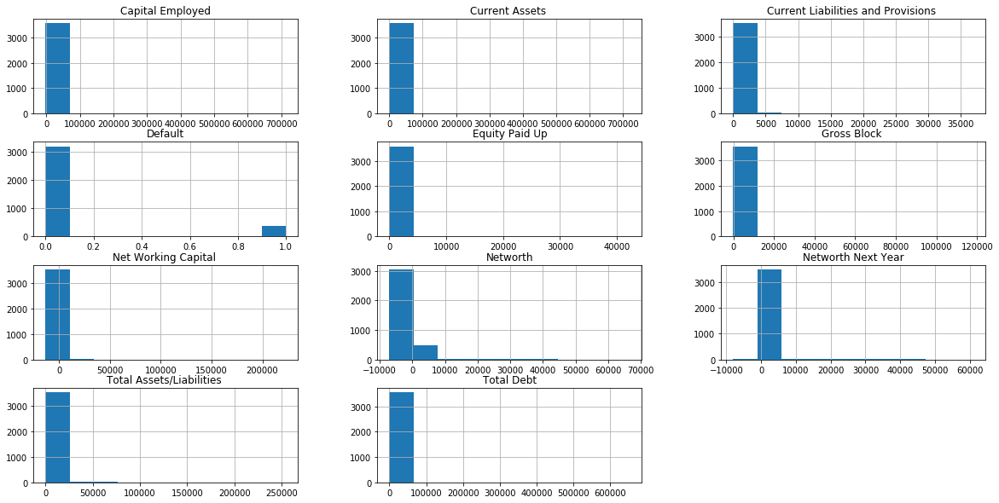

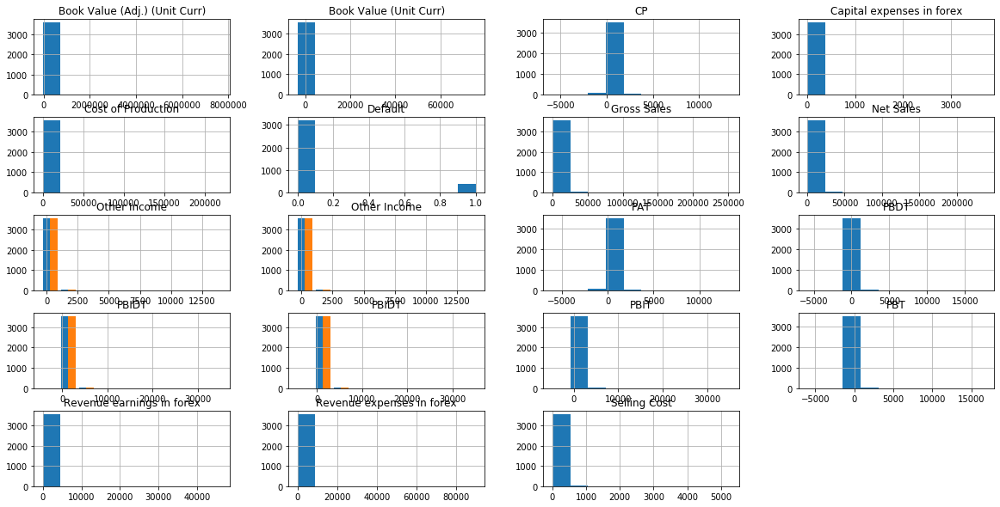

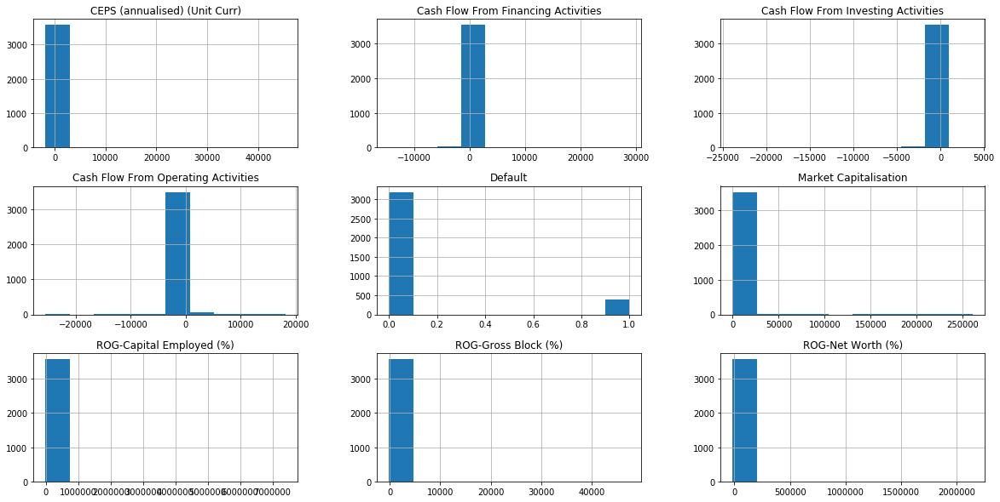

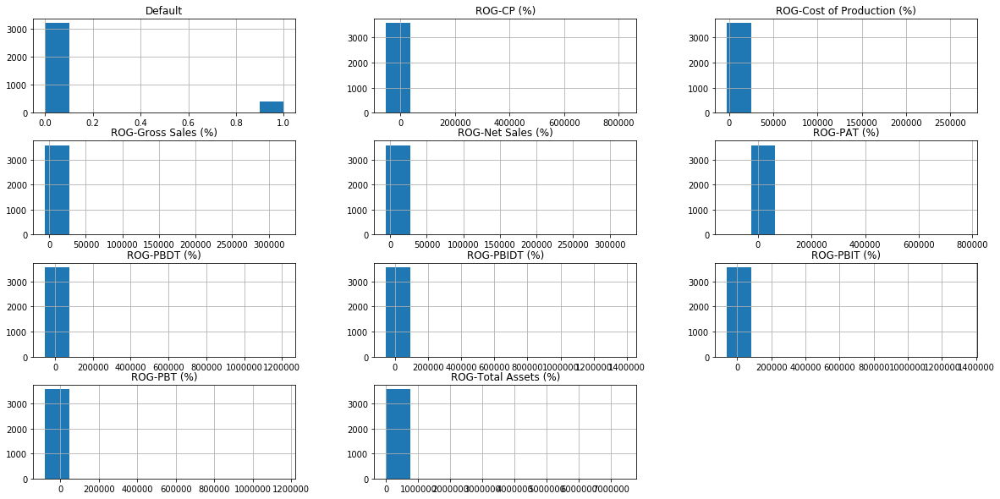

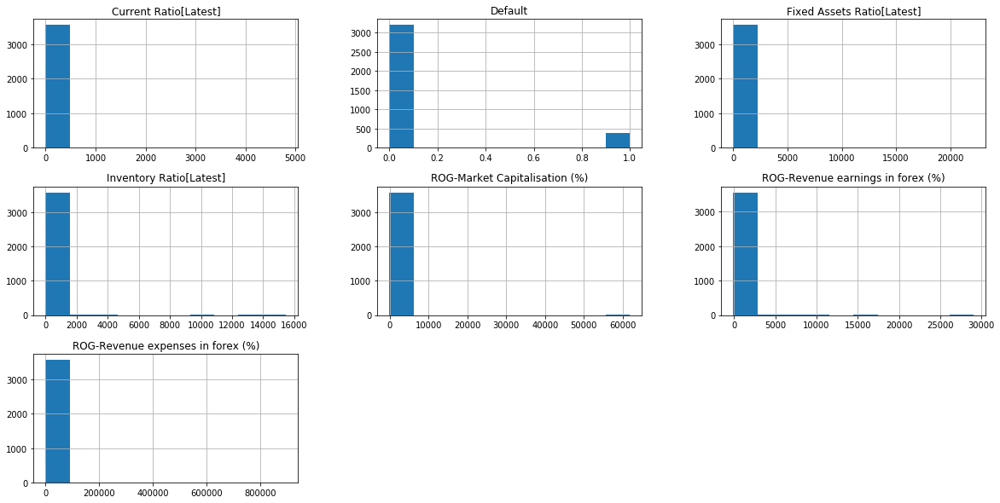

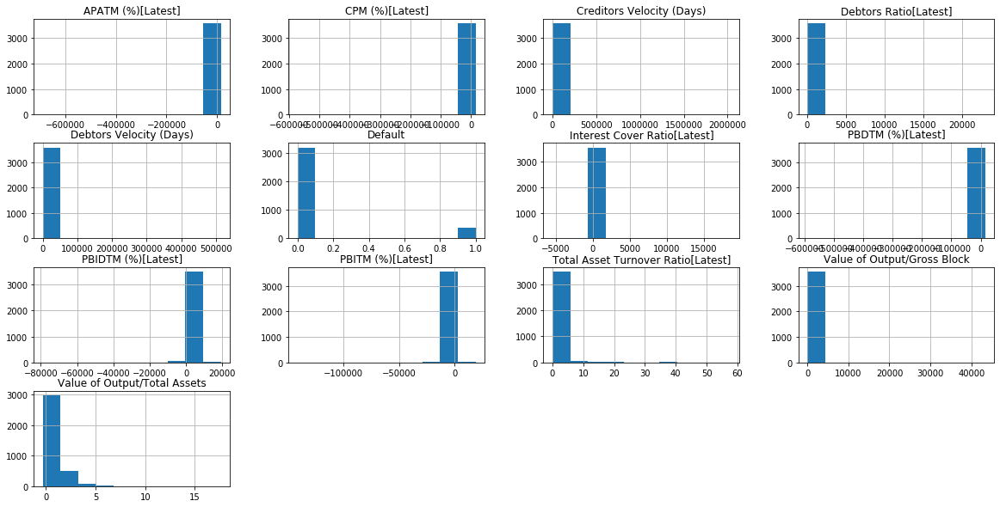

In [33]:
from pylab import rcParams
rcParams['figure.figsize'] = 20, 10

compd1.hist(bins=10);
plt.show()


compd2.hist(bins=10);
plt.show()

compd3.hist(bins=10);
plt.show()

compd4.hist(bins=10);
plt.show()

compd5.hist(bins=10);
plt.show()

compd6.hist(bins=10);
plt.show()


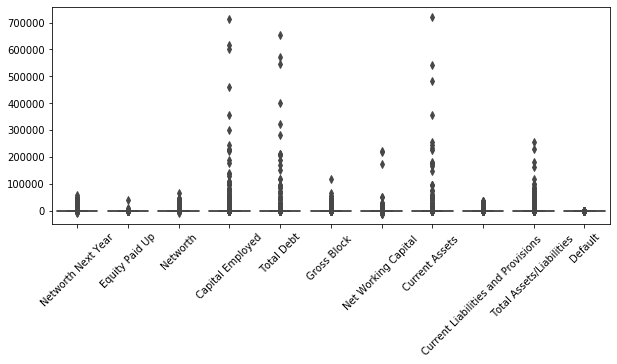

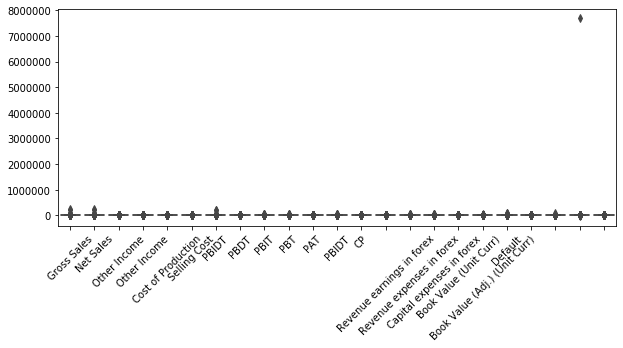

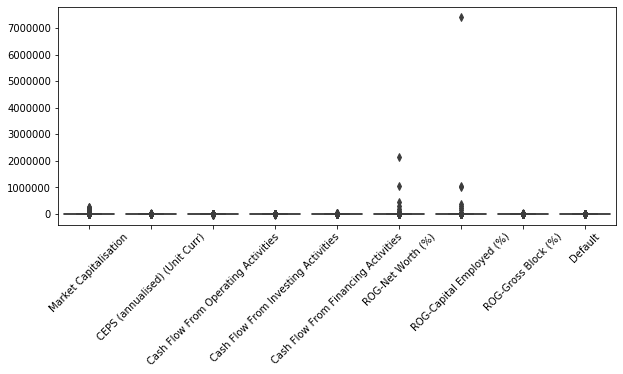

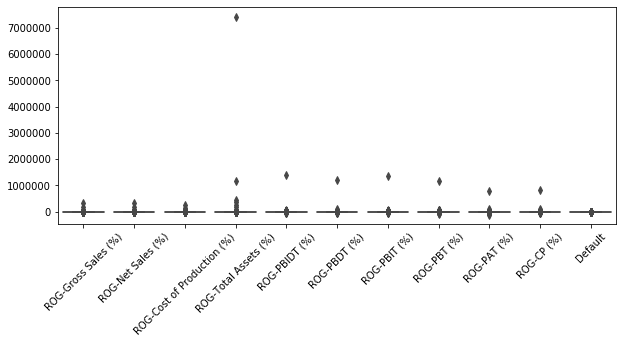

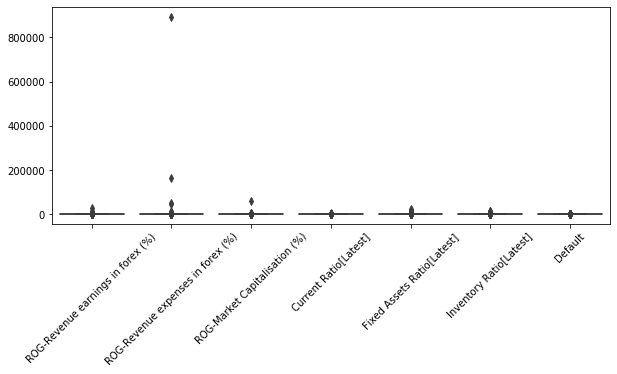

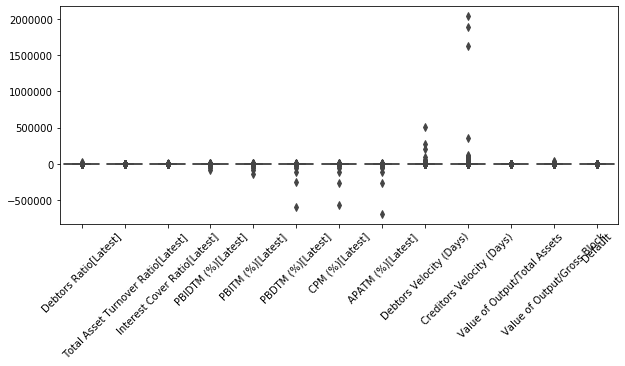

In [31]:
plt.figure(figsize=(10,4))
sns.boxplot(data=compd1)
plt.xticks(rotation=45)
plt.show()
plt.figure(figsize=(10,4))
sns.boxplot(data=compd2)
plt.xticks(rotation=45)
plt.show()
plt.figure(figsize=(10,4))
sns.boxplot(data=compd3)
plt.xticks(rotation=45)
plt.show()
plt.figure(figsize=(10,4))
sns.boxplot(data=compd4)
plt.xticks(rotation=45)
plt.show()
plt.figure(figsize=(10,4))
sns.boxplot(data=compd5)
plt.xticks(rotation=45)
plt.show()
plt.figure(figsize=(10,4))
sns.boxplot(data=compd6)
plt.xticks(rotation=45)
plt.show()


In [ ]:
sns.pairplot(data,  hue= 'Default')
plt.title('Pairplot')

In [35]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3581 entries, 0 to 3580
Data columns (total 67 columns):
Co_Code                                3576 non-null float64
Co_Name                                3576 non-null object
Networth Next Year                     3576 non-null float64
Equity Paid Up                         3576 non-null float64
Networth                               3576 non-null float64
Capital Employed                       3576 non-null float64
Total Debt                             3576 non-null float64
Gross Block                            3576 non-null float64
Net Working Capital                    3576 non-null float64
Current Assets                         3576 non-null float64
Current Liabilities and Provisions     3576 non-null float64
Total Assets/Liabilities               3576 non-null float64
Gross Sales                            3576 non-null float64
Net Sales                              3576 non-null float64
Other Income                           3

In [196]:
data.tail()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block,Default
3576,5455.0,Power Grid Corpn,43811.23,5231.59,38166.59,139632.92,95044.55,118264.26,-10923.29,12072.42,...,91.52,61.73,67.01,59.04,29.24,39.0,249.0,0.15,0.21,0.0
3577,566.0,Tata Steel,46637.38,971.41,66663.89,101142.12,28198.44,42583.38,-3727.04,12669.15,...,22.77,16.12,17.72,13.77,7.12,5.0,102.0,0.43,0.81,0.0
3578,13569.0,Sardar Sar.Narm.,47261.30,42263.46,44129.73,46810.68,2636.27,3746.17,665.73,1388.78,...,-78.54,-175.54,-115.15,-115.15,-212.16,0.0,0.0,0.01,0.02,0.0
3579,5554.0,Axis Bank,53164.91,474.10,44676.51,461977.78,402200.22,4497.01,0.00,358193.47,...,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.66,8.43,0.0
3580,2806.0,Infosys,61082.00,574.00,48068.00,48098.00,0.00,12869.00,28721.00,42752.00,...,34.19,31.94,34.19,25.55,23.31,62.0,1.0,0.89,4.45,0.0


In [27]:
data_X = data.drop(['Default','Co_Name'], axis = 1)
data_Y = data['Default']
data_Z = data['Co_Name']

In [28]:
data_X.head()

,Co_Code,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,...,Interest Cover Ratio[Latest],PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
0,16974,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,1116.85,...,-0.20,0.00,0.00,0.00,0.00,0.00,0,0,0.00,0.00
1,21214,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,1585.74,...,-0.84,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,0.31,0.24
2,14852,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,4601.39,...,-2.21,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,-0.03,-0.26
3,2439,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,3646.54,...,-0.16,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,0.24,1.90
4,23505,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,2849.58,...,-0.73,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.01,0.05


In [29]:
def remove_outlier(col):
    sorted(col)
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range= Q1-(1.5 * IQR)
    upper_range= Q3+(1.5 * IQR)
    return lower_range, upper_range

In [30]:
for column in data_X.columns:
    lr,ur=remove_outlier(data_X[column])
    data_X[column]=np.where(data_X[column]>ur,ur,data_X[column])
    data_X[column]=np.where(data_X[column]<lr,lr,data_X[column])

In [81]:
data_X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3581 entries, 0 to 3585
Data columns (total 65 columns):
Co_Code                                3581 non-null float64
Networth Next Year                     3581 non-null float64
Equity Paid Up                         3581 non-null float64
Networth                               3581 non-null float64
Capital Employed                       3581 non-null float64
Total Debt                             3581 non-null float64
Gross Block                            3581 non-null float64
Net Working Capital                    3581 non-null float64
Current Assets                         3581 non-null float64
Current Liabilities and Provisions     3581 non-null float64
Total Assets/Liabilities               3581 non-null float64
Gross Sales                            3581 non-null float64
Net Sales                              3581 non-null float64
Other Income                           3581 non-null float64
Value Of Output                        

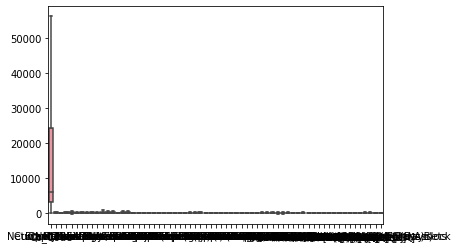

In [31]:

sns.boxplot(data=data_X)
plt.show()

In [32]:
Compdfinal = pd.concat([data_X, data_Y], axis = 1)

In [203]:
Compdfinal.head()

,Co_Code,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block,Default
0,16974.0,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,1116.85,...,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,1.0
1,21214.0,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,1585.74,...,-10.30,-39.74,-57.74,-57.74,-87.18,29.0,101.0,0.31,0.24,1.0
2,14852.0,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,4601.39,...,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97.0,558.0,-0.03,-0.26,1.0
3,2439.0,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,3646.54,...,-3.33,-7.21,-48.13,-47.70,-51.58,93.0,63.0,0.24,1.90,1.0
4,23505.0,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,2849.58,...,-295.55,-400.55,-845.88,379.79,274.79,3887.0,346.0,0.01,0.05,1.0


In [204]:
Compdfinal.tail(5)

,Co_Code,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block,Default
3576,5455.0,43811.23,5231.59,38166.59,139632.92,95044.55,118264.26,-10923.29,12072.42,22995.71,...,91.52,61.73,67.01,59.04,29.24,39.0,249.0,0.15,0.21,0.0
3577,566.0,46637.38,971.41,66663.89,101142.12,28198.44,42583.38,-3727.04,12669.15,16396.19,...,22.77,16.12,17.72,13.77,7.12,5.0,102.0,0.43,0.81,0.0
3578,13569.0,47261.30,42263.46,44129.73,46810.68,2636.27,3746.17,665.73,1388.78,723.05,...,-78.54,-175.54,-115.15,-115.15,-212.16,0.0,0.0,0.01,0.02,0.0
3579,5554.0,53164.91,474.10,44676.51,461977.78,402200.22,4497.01,0.00,358193.47,15101.07,...,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.66,8.43,0.0
3580,2806.0,61082.00,574.00,48068.00,48098.00,0.00,12869.00,28721.00,42752.00,14031.00,...,34.19,31.94,34.19,25.55,23.31,62.0,1.0,0.89,4.45,0.0


In [33]:
Compdfinal.shape

(3581, 66)

In [205]:
Compdfinal.tail(5)

,Co_Code,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,Current Liabilities and Provisions,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block,Default
3576,5455.0,43811.23,5231.59,38166.59,139632.92,95044.55,118264.26,-10923.29,12072.42,22995.71,...,91.52,61.73,67.01,59.04,29.24,39.0,249.0,0.15,0.21,0.0
3577,566.0,46637.38,971.41,66663.89,101142.12,28198.44,42583.38,-3727.04,12669.15,16396.19,...,22.77,16.12,17.72,13.77,7.12,5.0,102.0,0.43,0.81,0.0
3578,13569.0,47261.30,42263.46,44129.73,46810.68,2636.27,3746.17,665.73,1388.78,723.05,...,-78.54,-175.54,-115.15,-115.15,-212.16,0.0,0.0,0.01,0.02,0.0
3579,5554.0,53164.91,474.10,44676.51,461977.78,402200.22,4497.01,0.00,358193.47,15101.07,...,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.66,8.43,0.0
3580,2806.0,61082.00,574.00,48068.00,48098.00,0.00,12869.00,28721.00,42752.00,14031.00,...,34.19,31.94,34.19,25.55,23.31,62.0,1.0,0.89,4.45,0.0


In [89]:
Compdfinal.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3581 entries, 0 to 3585
Data columns (total 66 columns):
Co_Code                                3581 non-null float64
Networth Next Year                     3581 non-null float64
Equity Paid Up                         3581 non-null float64
Networth                               3581 non-null float64
Capital Employed                       3581 non-null float64
Total Debt                             3581 non-null float64
Gross Block                            3581 non-null float64
Net Working Capital                    3581 non-null float64
Current Assets                         3581 non-null float64
Current Liabilities and Provisions     3581 non-null float64
Total Assets/Liabilities               3581 non-null float64
Gross Sales                            3581 non-null float64
Net Sales                              3581 non-null float64
Other Income                           3581 non-null float64
Value Of Output                        

In [34]:
Compdata_X1 = Compdfinal[['Networth Next Year',

'Adjusted PAT',
'Market Capitalisation',
'CEPS (annualised) (Unit Curr)',
'Cash Flow From Operating Activities',
'Cash Flow From Investing Activities',
'Cash Flow From Financing Activities',
'ROG-PAT (%)',
'ROG-Market Capitalisation (%)',
'Current Ratio[Latest]',
'Fixed Assets Ratio[Latest]',
'Inventory Ratio[Latest]',
'Debtors Ratio[Latest]',
'Total Asset Turnover Ratio[Latest]',
'Interest Cover Ratio[Latest]',
'APATM (%)[Latest]',
'Debtors Velocity (Days)',
'Creditors Velocity (Days)',
'Value of Output/Total Assets',
'Value of Output/Gross Block',
'ROG-Net Worth (%)',
'ROG-Gross Block (%)',
'ROG-Cost of Production (%)',
'Cash Flow From Financing Activities',
'Default']]

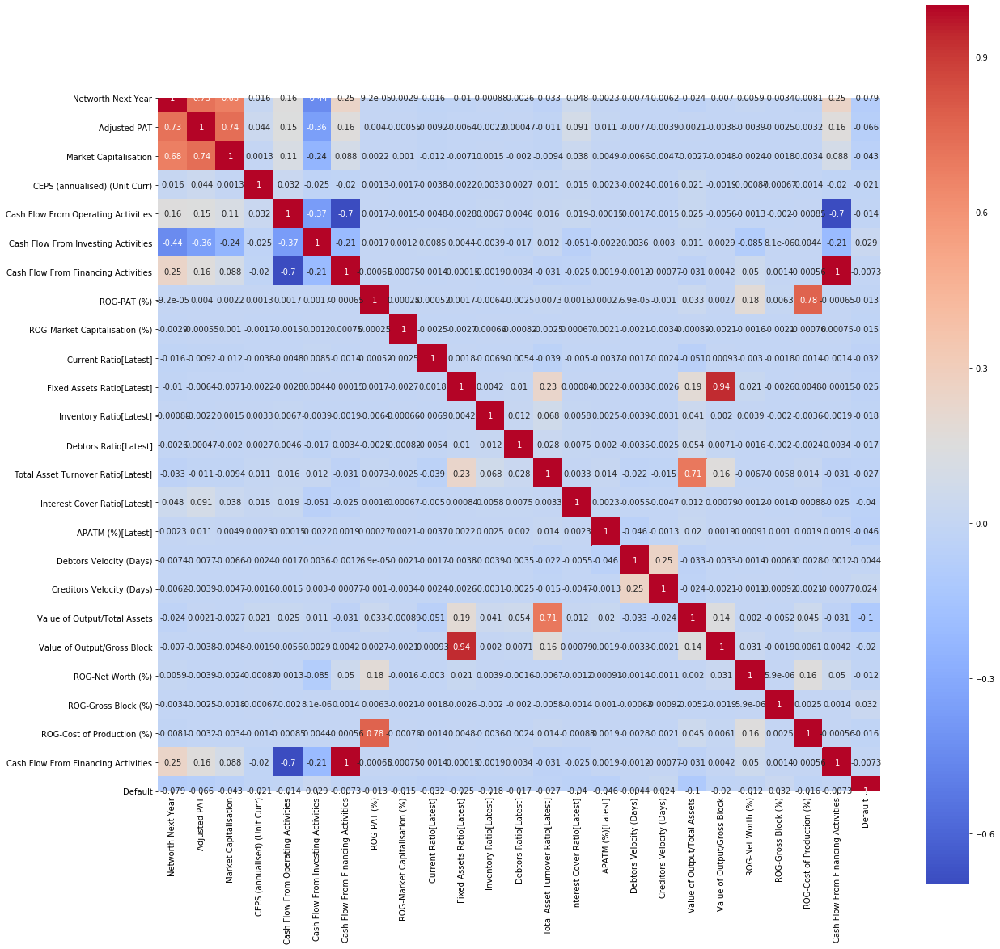

In [207]:
plt.figure(figsize=(20,20))
p=sns.heatmap(Compdata_X1.corr(), annot=True,cmap='coolwarm',square=True)

In [36]:

from statsmodels.stats.outliers_influence import variance_inflation_factor

In [37]:
vif_data = pd.DataFrame()
vif_data["feature"] = data.columns

In [39]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3581 entries, 0 to 3585
Data columns (total 67 columns):
Co_Code                                3581 non-null int64
Co_Name                                3581 non-null object
Networth Next Year                     3581 non-null float64
Equity Paid Up                         3581 non-null float64
Networth                               3581 non-null float64
Capital Employed                       3581 non-null float64
Total Debt                             3581 non-null float64
Gross Block                            3581 non-null float64
Net Working Capital                    3581 non-null float64
Current Assets                         3581 non-null float64
Current Liabilities and Provisions     3581 non-null float64
Total Assets/Liabilities               3581 non-null float64
Gross Sales                            3581 non-null float64
Net Sales                              3581 non-null float64
Other Income                           358

In [45]:
data1=data.drop(['Co_Name'],axis=1)

In [46]:
data1.values

array([[ 1.697400e+04, -8.021600e+03,  4.193600e+02, ...,  0.000000e+00,
         0.000000e+00,  1.000000e+00],
       [ 2.121400e+04, -3.986190e+03,  1.954930e+03, ...,  3.100000e-01,
         2.400000e-01,  1.000000e+00],
       [ 1.485200e+04, -3.192580e+03,  5.384000e+01, ..., -3.000000e-02,
        -2.600000e-01,  1.000000e+00],
       ...,
       [ 1.200200e+04,  8.813431e+04,  2.427950e+03, ...,  1.420000e+00,
         3.240000e+00,  0.000000e+00],
       [ 1.200100e+04,  9.129370e+04,  8.245460e+03, ...,  3.600000e-01,
         6.800000e-01,  0.000000e+00],
       [ 1.554200e+04,  1.117291e+05,  1.998700e+03, ...,  4.200000e-01,
         4.900000e-01,  0.000000e+00]])

In [47]:
data1.shape

(3581, 66)

In [105]:
data1.drop(['PBIDT','PBDT','PBIT','PBT','PAT','CP'], axis = 1, inplace=True)

In [106]:
vif = pd.DataFrame()
vif['VIF'] = [variance_inflation_factor(data1.values, i) for i in range(data1.shape[1])]
vif['variable'] = data1.columns

In [107]:
pd.set_option('max_rows', None)
vif

,VIF,variable
0,1.289656e+00,Co_Code
1,2.574517e+01,Networth Next Year
2,1.489876e+00,Equity Paid Up
3,6.287015e+01,Networth
4,2.608702e+03,Capital Employed
5,1.273709e+03,Total Debt
6,1.916345e+01,Gross Block
7,4.969258e+01,Net Working Capital
8,1.835601e+02,Current Assets
9,2.388149e+01,Current Liabilities and Provisions


In [59]:
Compdata_X2 = data1[[
'Equity Paid Up',
'Book Value (Unit Curr)',
'Book Value (Adj.) (Unit Curr)',
'CEPS (annualised) (Unit Curr)',
'ROG-Gross Block (%)',
'ROG-Revenue earnings in forex (%)',
'ROG-Revenue expenses in forex (%)',
'ROG-Market Capitalisation (%)',
'Inventory Ratio[Latest]',
'Current Ratio[Latest]',
'Debtors Ratio[Latest]',
'Debtors Velocity (Days)',
'Creditors Velocity (Days)',
'Default']]

In [108]:
vif1= pd.DataFrame()
vif1['VIF'] = [variance_inflation_factor(Compdata_X2.values, i) for i in range(Compdata_X2.shape[1])]
vif1['variable'] = Compdata_X2.columns

In [110]:
pd.set_option('max_rows', None)
vif1

,VIF,variable
0,1.001824,Equity Paid Up
1,1.287746,Book Value (Unit Curr)
2,1.000062,Book Value (Adj.) (Unit Curr)
3,1.287241,CEPS (annualised) (Unit Curr)
4,1.001952,ROG-Gross Block (%)
5,1.000376,ROG-Revenue earnings in forex (%)
6,1.000092,ROG-Revenue expenses in forex (%)
7,1.000122,ROG-Market Capitalisation (%)
8,1.001524,Inventory Ratio[Latest]
9,1.000138,Current Ratio[Latest]


In [60]:
Compdata_X2.shape

(3581, 14)

In [61]:
Compdata_X2

,Equity Paid Up,Book Value (Unit Curr),Book Value (Adj.) (Unit Curr),CEPS (annualised) (Unit Curr),ROG-Gross Block (%),ROG-Revenue earnings in forex (%),ROG-Revenue expenses in forex (%),ROG-Market Capitalisation (%),Inventory Ratio[Latest],Current Ratio[Latest],Debtors Ratio[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Default
0,419.36,-167.58,-167.58,-22.09,-9.75,0.00,0.00,0.00,0.00,0.02,0.00,0,0,1.0
1,1954.93,-15.18,-15.18,-0.02,3.17,1.93,34.00,6.61,804.44,0.08,10.35,29,101,1.0
2,53.84,94.14,94.14,-148.31,-2.07,-100.00,-81.21,-6.31,0.01,1.06,0.42,97,558,1.0
3,157.30,-39.64,-39.64,-43.08,-1.80,-52.91,-33.85,-13.94,411.15,0.09,9.26,93,63,1.0
4,50.30,-212.89,-212.89,-159.50,0.34,-100.00,-91.17,-12.91,0.02,0.50,1.28,3887,346,1.0
5,179.35,-140.47,-140.47,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0,0,1.0
6,30.82,-337.17,-337.17,-390.94,-0.66,-87.06,-97.31,-11.43,0.27,0.03,0.36,456,12,1.0
7,45.92,-42.37,-42.37,-3.84,-28.41,-100.00,-100.00,-30.89,0.32,0.41,0.19,828,622,1.0
8,61.23,-25.49,-25.49,-1.65,5.95,0.00,8.04,21.45,189.17,0.12,14.01,34,145,1.0
9,288.00,-74.30,-74.30,-9.79,0.59,0.00,-88.37,27.41,10.26,0.65,0.87,1112,913,1.0


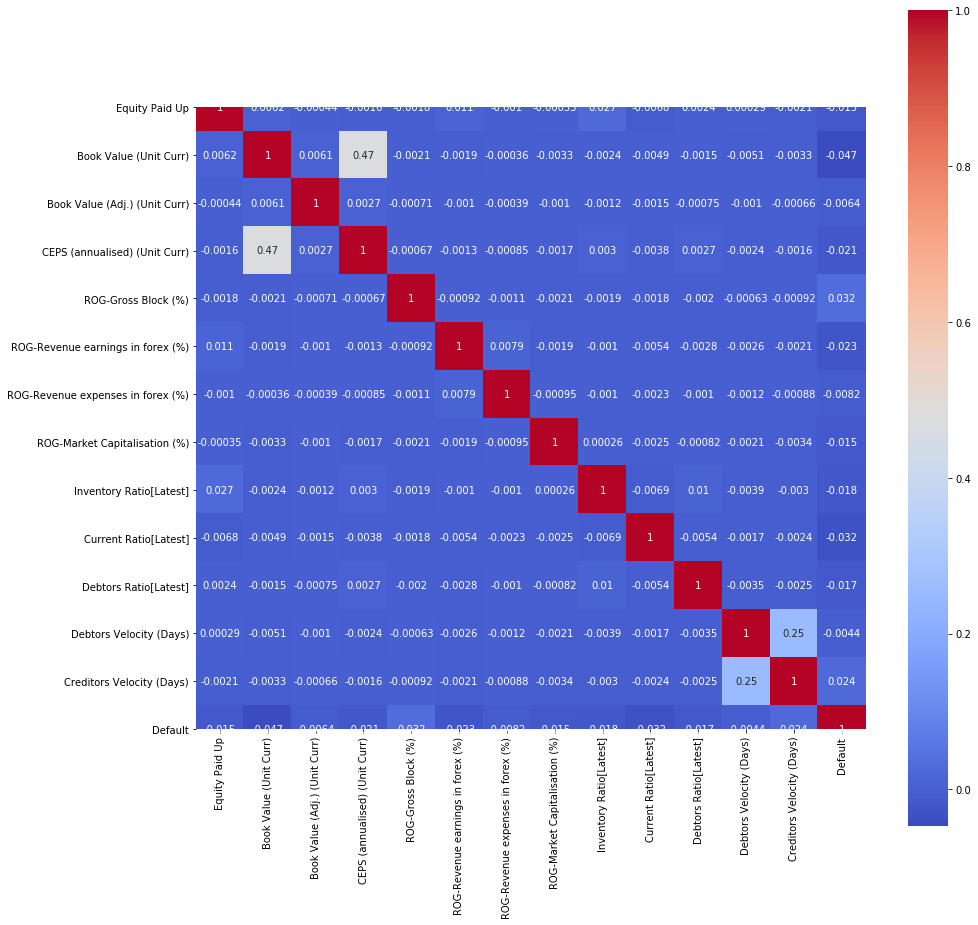

In [62]:
plt.figure(figsize=(15,15))
p=sns.heatmap(Compdata_X2.corr(), annot=True,cmap='coolwarm',square=True)

In [63]:
Compdata_X2.shape

(3581, 14)

In [66]:
Compdata_X2.isnull().sum()

Equity Paid Up                       0
Book Value (Unit Curr)               0
Book Value (Adj.) (Unit Curr)        0
CEPS (annualised) (Unit Curr)        0
ROG-Gross Block (%)                  0
ROG-Revenue earnings in forex (%)    0
ROG-Revenue expenses in forex (%)    0
ROG-Market Capitalisation (%)        0
Inventory Ratio[Latest]              0
Current Ratio[Latest]                0
Debtors Ratio[Latest]                0
Debtors Velocity (Days)              0
Creditors Velocity (Days)            0
Default                              0
dtype: int64

In [67]:
Compdata_X2=Compdata_X2.dropna()

In [68]:
Compdata_X2.shape

(3581, 14)

In [69]:
from sklearn.model_selection import train_test_split
Train,Test=train_test_split(Compdata_X2,test_size=0.33,stratify=Compdata_X2['Default'],random_state=42)

In [70]:
train_features = (Train.columns).tolist()
train_features.remove('Default')

features_columns=train_features
Target_val='Default'

In [71]:
Train.columns

Index(['Equity Paid Up', 'Book Value (Unit Curr)',
       'Book Value (Adj.) (Unit Curr)', 'CEPS (annualised) (Unit Curr)',
       'ROG-Gross Block (%)', 'ROG-Revenue earnings in forex (%)',
       'ROG-Revenue expenses in forex (%)', 'ROG-Market Capitalisation (%)',
       'Inventory Ratio[Latest]', 'Current Ratio[Latest]',
       'Debtors Ratio[Latest]', 'Debtors Velocity (Days)',
       'Creditors Velocity (Days)', 'Default'],
      dtype='object')

In [72]:
Train.head()

,Equity Paid Up,Book Value (Unit Curr),Book Value (Adj.) (Unit Curr),CEPS (annualised) (Unit Curr),ROG-Gross Block (%),ROG-Revenue earnings in forex (%),ROG-Revenue expenses in forex (%),ROG-Market Capitalisation (%),Inventory Ratio[Latest],Current Ratio[Latest],Debtors Ratio[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Default
2218,3.06,132.56,132.56,33.04,-10.13,-12.43,-3.71,91.64,5.79,1.26,2.81,119,37,0.0
499,3.04,3.45,3.45,-0.20,6.45,-11.37,109.63,0.00,3.22,1.03,9.97,50,51,0.0
1155,82.80,1.50,1.50,1.45,74.14,0.00,0.00,78.02,3.63,2.48,2.21,34,82,0.0
1349,4.15,20.34,20.34,3.45,0.96,0.00,0.00,-1.26,1117.00,1.16,31.46,15,0,0.0
2709,16.59,6.81,6.81,0.61,4.52,-44.35,41.89,75.64,6.33,1.24,5.24,69,91,0.0


In [73]:
Train.shape

(2399, 14)

In [74]:
Test.shape

(1182, 14)

In [75]:
Train['Default'].value_counts(1)

0.0    0.892038
1.0    0.107962
Name: Default, dtype: float64

In [76]:
Test['Default'].value_counts(1)

0.0    0.891709
1.0    0.108291
Name: Default, dtype: float64

In [77]:
Train.columns

Index(['Equity Paid Up', 'Book Value (Unit Curr)',
       'Book Value (Adj.) (Unit Curr)', 'CEPS (annualised) (Unit Curr)',
       'ROG-Gross Block (%)', 'ROG-Revenue earnings in forex (%)',
       'ROG-Revenue expenses in forex (%)', 'ROG-Market Capitalisation (%)',
       'Inventory Ratio[Latest]', 'Current Ratio[Latest]',
       'Debtors Ratio[Latest]', 'Debtors Velocity (Days)',
       'Creditors Velocity (Days)', 'Default'],
      dtype='object')

In [222]:
Train

,ROG-PAT (%),ROG-Market Capitalisation (%),Current Ratio[Latest],Fixed Assets Ratio[Latest],Inventory Ratio[Latest],Debtors Ratio[Latest],Interest Cover Ratio[Latest],Debtors Velocity (Days),Creditors Velocity (Days),ROG-Net Worth (%),ROG-Gross Block (%),ROG-Cost of Production (%),Cash Flow From Financing Activities,Default
2216,0.00,-0.23,105.38,26.82,5.00,0.00,15.18,46.0,6.0,18.37,-89.93,-66.41,6.37,0.0
498,-204.76,-0.28,1.17,2.36,7.79,3.49,2.24,2023.0,1179.0,-36.00,17.88,-63.68,1.01,0.0
1154,0.00,-21.56,1.48,16.54,12.14,7.43,1.29,53.0,19.0,1.76,15.49,-25.61,-0.55,0.0
1348,980.00,-35.97,1.34,4.02,34.41,0.70,4.60,422.0,642.0,11.04,-4.79,-2.31,3.69,0.0
2706,247.81,111.54,1.17,1.01,7.54,6.24,5.65,53.0,34.0,8.58,4.74,19.24,-4.39,0.0
2078,-9.40,-30.38,1.58,1.77,5.09,2.35,1.69,218.0,117.0,3.77,-1.86,9.11,-5.63,0.0
998,0.00,0.00,3.51,3.12,2.72,2.80,1.31,96.0,88.0,1.15,49.23,-6.58,-0.06,0.0
2236,0.77,0.00,1.21,3.81,3.03,2.34,2.06,107.0,42.0,70.55,14.66,30.86,12.47,0.0
2400,-129.36,24.27,3.47,1.20,0.17,7.36,0.86,3.0,0.0,-0.82,6.03,16.46,-8.72,0.0
1291,1000.00,0.00,1.59,29.60,3.44,148.00,9.00,0.0,0.0,6.75,0.00,0.00,0.68,0.0


In [264]:
Train['Current Ratio[Latest]']

677        0.96
3135       0.82
1618       3.87
2182       1.53
1956       4.24
1429      10.00
3362       2.35
285        0.54
2857       0.75
1500       1.66
1896       1.79
484        1.39
2303      25.75
3342       1.16
814        1.21
2861       0.71
2349       1.11
967      443.85
608        0.00
275        0.19
1367      53.80
315        0.04
2872       1.02
973       39.34
2620     134.03
1658       1.38
535        1.18
492        0.00
1688       1.27
2505       1.29
2920       0.71
3353       1.11
1809       0.97
2761       0.86
2772       2.52
3133       0.75
3208       2.23
2384       1.55
3057       0.62
1495       1.02
1927       1.11
896       51.74
1209       0.88
1445       0.71
3533       0.00
762       37.90
110        0.14
3579       0.00
1648      18.34
658        1.25
144        0.01
3242       2.09
664       58.20
3000       1.17
3313       0.96
2706       1.17
3046       0.94
3077       1.01
638        1.37
3320       0.76
3154       1.45
2177       0.74
1800    

In [265]:
Train.shape

(2395, 14)

In [266]:
Train.columns

Index(['ROG-PAT (%)', 'ROG-Market Capitalisation (%)', 'Current Ratio[Latest]',
       'Fixed Assets Ratio[Latest]', 'Inventory Ratio[Latest]',
       'Debtors Ratio[Latest]', 'Interest Cover Ratio[Latest]',
       'Debtors Velocity (Days)', 'Creditors Velocity (Days)',
       'ROG-Net Worth (%)', 'ROG-Gross Block (%)',
       'ROG-Cost of Production (%)', 'Cash Flow From Financing Activities',
       'Default'],
      dtype='object')

In [78]:
Train = Train.rename(columns = {'Equity Paid Up': 'EquityPaidUp', 'Book Value (Unit Curr)': 'BookValurUnitCurr','Book Value (Adj.) (Unit Curr)':'BookValueAdjUnitCurr','CEPS (annualised) (Unit Curr)':'CEPSannualisedUnitCurr','ROG-Gross Block (%)':'ROGGrossBlockPerc','ROG-Revenue earnings in forex (%)':'ROGRevenueearningsinforexper','ROG-Revenue expenses in forex (%)':'ROGRevenueexpensesinforexper','ROG-Market Capitalisation (%)':'ROGMarketCapitalisationper','Inventory Ratio[Latest]':'InventoryRatioLatest','Current Ratio[Latest]':'CurrentRatioLatest','Debtors Ratio[Latest]':'DebtorsRatioLatest','Debtors Velocity (Days)':'DebtorsVelocityDays','Creditors Velocity (Days)':'CreditorsVelocityDays'}, inplace = False)

In [79]:
Train.columns

Index(['EquityPaidUp', 'BookValurUnitCurr', 'BookValueAdjUnitCurr',
       'CEPSannualisedUnitCurr', 'ROGGrossBlockPerc',
       'ROGRevenueearningsinforexper', 'ROGRevenueexpensesinforexper',
       'ROGMarketCapitalisationper', 'InventoryRatioLatest',
       'CurrentRatioLatest', 'DebtorsRatioLatest', 'DebtorsVelocityDays',
       'CreditorsVelocityDays', 'Default'],
      dtype='object')

In [80]:
Train.shape

(2399, 14)

 Build Logistic Regression Model (using statsmodel library) on most important variables on Train Dataset and choose the optimum cutoff. Also showcase your model building approach

## Model-1

In [81]:
f1='Default ~ EquityPaidUp + BookValurUnitCurr + BookValueAdjUnitCurr + CEPSannualisedUnitCurr + ROGGrossBlockPerc + ROGRevenueearningsinforexper + ROGRevenueexpensesinforexper + ROGMarketCapitalisationper + CurrentRatioLatest + DebtorsRatioLatest+ DebtorsVelocityDays + CreditorsVelocityDays + InventoryRatioLatest '

In [82]:
import statsmodels.formula.api as SM
logitmodel = SM.logit(formula=f1,data=Train).fit()
logitmodel.summary()

Optimization terminated successfully.
         Current function value: 0.180894
         Iterations 13


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 2399
Model:                          Logit   Df Residuals:                     2385
Method:                           MLE   Df Model:                           13
Date:                Sun, 26 Dec 2021   Pseudo R-squ.:                  0.4714
Time:                        17:18:45   Log-Likelihood:                -433.96
converged:                       True   LL-Null:                       -821.02
Covariance Type:            nonrobust   LLR p-value:                4.848e-157
================================================================================================
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept                       -0.2273      0.137     -1.656      0.098      -0.496       0.042
EquityPaidUp                    -0.0008      0.001     -0.871      0.384      -0.002       0.001
BookValurUnitCurr               -0.0670      0.006    -11.465      0.000      -0.078      -0.056
BookValueAdjUnitCurr          1.068e-06   4.57e-05      0.023      0.981   -8.85e-05    9.07e-05
CEPSannualisedUnitCurr           0.0559      0.010      5.614      0.000       0.036       0.075
ROGGrossBlockPerc               -0.0065      0.003     -2.112      0.035      -0.012      -0.000
ROGRevenueearningsinforexper    -0.0040      0.002     -2.038      0.042      -0.008      -0.000
ROGRevenueexpensesinforexper    -0.0002      0.000     -0.420      0.674      -0.001       0.001
ROGMarketCapitalisationper      -0.0019      0.001     -1.759      0.079      -0.004       0.000
CurrentRatioLatest              -0.6951      0.102     -6.842      0.000      -0.894      -0.496
DebtorsRatioLatest              -0.0003      0.001     -0.326      0.744      -0.002       0.001
DebtorsVelocityDays          -1.512e-05   2.96e-05     -0.510      0.610   -7.32e-05     4.3e-05
CreditorsVelocityDays         5.895e-06   4.46e-06      1.322      0.186   -2.84e-06    1.46e-05
InventoryRatioLatest            -0.0002      0.001     -0.317      0.751      -0.001       0.001
================================================================================================

Possibly complete quasi-separation: A fraction 0.28 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [83]:
Probability1=logitmodel.predict() 
Pred_class1=(Probability1>=0.5).astype(np.int)

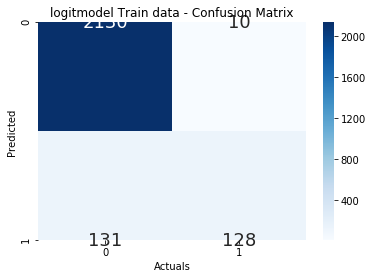

In [84]:
from pylab import rcParams
rcParams['figure.figsize'] = 6,4
sns.heatmap(metrics.confusion_matrix(Train['Default'],Pred_class1),annot_kws={"size":18},annot=True
            ,fmt='.5g',cmap='Blues')
plt.xlabel('Actuals')
plt.ylabel('Predicted',rotation=90)
plt.title('logitmodel Train data - Confusion Matrix')
plt.show()

In [85]:
print('\033[1m Classification Report for Logit model _1 Train data \n\n \033[0m ',classification_report(Train['Default'],Pred_class1))

 Classification Report for Logit model _1 Train data 

                 precision    recall  f1-score   support

         0.0       0.94      1.00      0.97      2140
         1.0       0.93      0.49      0.64       259

    accuracy                           0.94      2399
   macro avg       0.93      0.74      0.81      2399
weighted avg       0.94      0.94      0.93      2399



In [87]:
Test.columns

Index(['EquityPaidUp', 'BookValurUnitCurr', 'BookValueAdjUnitCurr',
       'CEPSannualisedUnitCurr', 'ROGGrossBlockPerc',
       'ROGRevenueearningsinforexper', 'ROGRevenueexpensesinforexper',
       'ROGMarketCapitalisationper', 'InventoryRatioLatest',
       'CurrentRatioLatest', 'DebtorsRatioLatest', 'DebtorsVelocityDays',
       'CreditorsVelocityDays', 'Default'],
      dtype='object')

In [86]:
Test = Test.rename(columns = {'Equity Paid Up': 'EquityPaidUp', 'Book Value (Unit Curr)': 'BookValurUnitCurr','Book Value (Adj.) (Unit Curr)':'BookValueAdjUnitCurr','CEPS (annualised) (Unit Curr)':'CEPSannualisedUnitCurr','ROG-Gross Block (%)':'ROGGrossBlockPerc','ROG-Revenue earnings in forex (%)':'ROGRevenueearningsinforexper','ROG-Revenue expenses in forex (%)':'ROGRevenueexpensesinforexper','ROG-Market Capitalisation (%)':'ROGMarketCapitalisationper','Inventory Ratio[Latest]':'InventoryRatioLatest','Current Ratio[Latest]':'CurrentRatioLatest','Debtors Ratio[Latest]':'DebtorsRatioLatest','Debtors Velocity (Days)':'DebtorsVelocityDays','Creditors Velocity (Days)':'CreditorsVelocityDays'}, inplace = False)

In [88]:
    test_prob1 = logitmodel.predict(Test[[ 'EquityPaidUp' , 'BookValurUnitCurr' ,'BookValueAdjUnitCurr' , 'CEPSannualisedUnitCurr' , 'ROGGrossBlockPerc', 'ROGRevenueearningsinforexper' , 'ROGRevenueexpensesinforexper' , 'ROGMarketCapitalisationper' , 'InventoryRatioLatest' , 'CurrentRatioLatest', 'DebtorsRatioLatest' , 'DebtorsVelocityDays' , 'CreditorsVelocityDays']])

Text(0.5, 1, 'Model 1 - Confusion Matrix for Test')

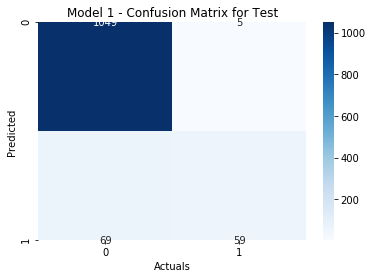

In [89]:
test_class1=[]
for i in range(0,len(test_prob1)):
    if np.array(test_prob1)[i]>0.5:
        a=1
    else:
        a=0
    test_class1.append(a)
sns.heatmap(metrics.confusion_matrix(Test['Default'],test_class1),annot=True
            ,fmt='.5g',cmap='Blues')
plt.xlabel('Actuals')
plt.ylabel('Predicted',rotation=90)
plt.title('Model 1 - Confusion Matrix for Test')

AUC: 0.9489


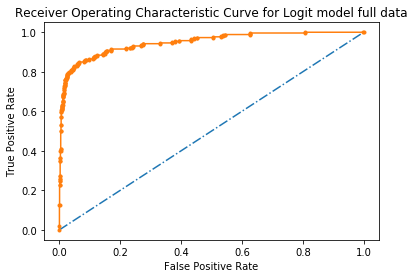

In [90]:
from pylab import rcParams
rcParams['figure.figsize'] = 6,4
auc = metrics.roc_auc_score(Train['Default'],Probability1)
print('AUC: %.4f' % auc)

fpr, tpr, thresholds = metrics.roc_curve(Train['Default'], Probability1)
plt.plot([0, 1], [0, 1], linestyle='-.')

plt.plot(fpr, tpr, marker='.')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic Curve for Logit model full data")
plt.show()

## Model-2

In [112]:
Train.columns

Index(['EquityPaidUp', 'BookValurUnitCurr', 'BookValueAdjUnitCurr',
       'CEPSannualisedUnitCurr', 'ROGGrossBlockPerc',
       'ROGRevenueearningsinforexper', 'ROGRevenueexpensesinforexper',
       'ROGMarketCapitalisationper', 'InventoryRatioLatest',
       'CurrentRatioLatest', 'DebtorsRatioLatest', 'DebtorsVelocityDays',
       'CreditorsVelocityDays', 'Default'],
      dtype='object')

In [115]:
Train2 = Train[[
'EquityPaidUp',
'BookValurUnitCurr',
'CEPSannualisedUnitCurr',
'ROGGrossBlockPerc',
'ROGRevenueearningsinforexper',
'ROGRevenueexpensesinforexper',
'ROGMarketCapitalisationper',
'InventoryRatioLatest',
'CurrentRatioLatest',
'DebtorsRatioLatest',
'Default']]


In [116]:
f2='Default ~ EquityPaidUp + BookValurUnitCurr  + CEPSannualisedUnitCurr + ROGGrossBlockPerc + ROGRevenueearningsinforexper + ROGRevenueexpensesinforexper + ROGMarketCapitalisationper + CurrentRatioLatest + DebtorsRatioLatest + InventoryRatioLatest'

In [117]:
import statsmodels.formula.api as sm
LogitModel_2 = sm.logit(formula=f2,data=Train2).fit()
LogitModel_2.summary()

Optimization terminated successfully.
         Current function value: 0.181243
         Iterations 13


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Default   No. Observations:                 2399
Model:                          Logit   Df Residuals:                     2388
Method:                           MLE   Df Model:                           10
Date:                Sun, 26 Dec 2021   Pseudo R-squ.:                  0.4704
Time:                        18:48:54   Log-Likelihood:                -434.80
converged:                       True   LL-Null:                       -821.02
Covariance Type:            nonrobust   LLR p-value:                1.742e-159
================================================================================================
                                   coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------
Intercept                       -0.2263      0.138     -1.641      0.101      -0.497       0.044
EquityPaidUp                    -0.0007      0.001     -0.856      0.392      -0.002       0.001
BookValurUnitCurr               -0.0670      0.006    -11.475      0.000      -0.078      -0.056
CEPSannualisedUnitCurr           0.0561      0.010      5.651      0.000       0.037       0.076
ROGGrossBlockPerc               -0.0065      0.003     -2.137      0.033      -0.013      -0.001
ROGRevenueearningsinforexper    -0.0040      0.002     -2.032      0.042      -0.008      -0.000
ROGRevenueexpensesinforexper    -0.0002      0.000     -0.421      0.674      -0.001       0.001
ROGMarketCapitalisationper      -0.0019      0.001     -1.802      0.072      -0.004       0.000
CurrentRatioLatest              -0.6936      0.102     -6.829      0.000      -0.893      -0.495
DebtorsRatioLatest              -0.0003      0.001     -0.326      0.744      -0.002       0.001
InventoryRatioLatest            -0.0002      0.001     -0.319      0.750      -0.001       0.001
================================================================================================

Possibly complete quasi-separation: A fraction 0.28 of observations can be
perfectly predicted. This might indicate that there is complete
quasi-separation. In this case some parameters will not be identified.
"""

In [118]:
lgcoef2=pd.DataFrame(LogitModel_2.params,columns=["Coef"])
lgcoef2["PValue"]=LogitModel_2.pvalues
print(lgcoef2)

                                  Coef        PValue
Intercept                    -0.226316  1.008050e-01
EquityPaidUp                 -0.000736  3.920684e-01
BookValurUnitCurr            -0.067002  1.754702e-30
CEPSannualisedUnitCurr        0.056117  1.596929e-08
ROGGrossBlockPerc            -0.006531  3.255887e-02
ROGRevenueearningsinforexper -0.003965  4.215783e-02
ROGRevenueexpensesinforexper -0.000196  6.735504e-01
ROGMarketCapitalisationper   -0.001930  7.161994e-02
CurrentRatioLatest           -0.693603  8.560264e-12
DebtorsRatioLatest           -0.000296  7.444095e-01
InventoryRatioLatest         -0.000196  7.500665e-01


In [119]:
lgcoef2.loc[:,"Odds_Ratio"]=np.exp(lgcoef2.Coef)
lgcoef2["Probability"]=lgcoef2["Odds_Ratio"]/(1+lgcoef2["Odds_Ratio"])
lgcoef2=lgcoef2.sort_values(by="Odds_Ratio",ascending=False)
lgcoef2

,Coef,PValue,Odds_Ratio,Probability
CEPSannualisedUnitCurr,0.056117,1.596929e-08,1.057721,0.514026
InventoryRatioLatest,-0.000196,7.500665e-01,0.999804,0.499951
ROGRevenueexpensesinforexper,-0.000196,6.735504e-01,0.999804,0.499951
DebtorsRatioLatest,-0.000296,7.444095e-01,0.999704,0.499926
EquityPaidUp,-0.000736,3.920684e-01,0.999265,0.499816
ROGMarketCapitalisationper,-0.001930,7.161994e-02,0.998072,0.499517
ROGRevenueearningsinforexper,-0.003965,4.215783e-02,0.996042,0.499009
ROGGrossBlockPerc,-0.006531,3.255887e-02,0.993490,0.498367
BookValurUnitCurr,-0.067002,1.754702e-30,0.935194,0.483256
Intercept,-0.226316,1.008050e-01,0.797466,0.443661


In [120]:
Probability2=LogitModel_2.predict() 
Pred_class2=(Probability2>=0.5).astype(np.int)

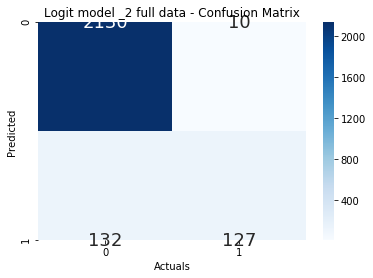

In [121]:
from pylab import rcParams
rcParams['figure.figsize'] = 6,4
sns.heatmap(metrics.confusion_matrix(Train2['Default'],Pred_class2),annot_kws={"size":18},annot=True
            ,fmt='.5g',cmap='Blues')
plt.xlabel('Actuals')
plt.ylabel('Predicted',rotation=90)
plt.title('Logit model _2 full data - Confusion Matrix')
plt.show()

In [122]:
print('\033[1m Classification Report for Logit model _2 Train data \n\n \033[0m ',classification_report(Train2['Default'],Pred_class2))

 Classification Report for Logit model _2 Train data 

                 precision    recall  f1-score   support

         0.0       0.94      1.00      0.97      2140
         1.0       0.93      0.49      0.64       259

    accuracy                           0.94      2399
   macro avg       0.93      0.74      0.80      2399
weighted avg       0.94      0.94      0.93      2399



AUC: 0.9488


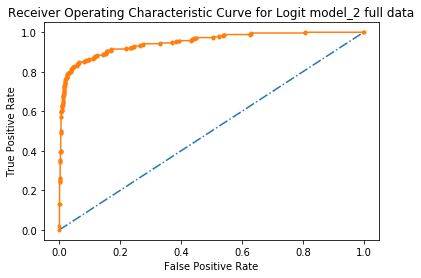

In [123]:
from pylab import rcParams
rcParams['figure.figsize'] = 6,4
auc = metrics.roc_auc_score(Train2['Default'],Probability2)
print('AUC: %.4f' % auc)

fpr, tpr, thresholds = metrics.roc_curve(Train2['Default'], Probability2)
plt.plot([0, 1], [0, 1], linestyle='-.')


plt.plot(fpr, tpr, marker='.')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Receiver Operating Characteristic Curve for Logit model_2 full data")
plt.show()

In [124]:
Train2.columns

Index(['EquityPaidUp', 'BookValurUnitCurr', 'CEPSannualisedUnitCurr',
       'ROGGrossBlockPerc', 'ROGRevenueearningsinforexper',
       'ROGRevenueexpensesinforexper', 'ROGMarketCapitalisationper',
       'InventoryRatioLatest', 'CurrentRatioLatest', 'DebtorsRatioLatest',
       'Default'],
      dtype='object')

In [125]:
test_prob2 = LogitModel_2.predict(Test[['EquityPaidUp' , 'BookValurUnitCurr'  , 'CEPSannualisedUnitCurr' , 'ROGGrossBlockPerc', 'ROGRevenueearningsinforexper' , 'ROGRevenueexpensesinforexper' , 'ROGMarketCapitalisationper' , 'InventoryRatioLatest' , 'CurrentRatioLatest', 'DebtorsRatioLatest' ]])

In [126]:
test_class2=[]
for i in range(0,len(test_prob2)):
    if np.array(test_prob2)[i]>0.5:
        a=1
    else:
        a=0
    test_class2.append(a)

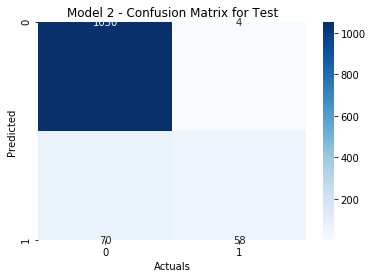

In [127]:
sns.heatmap(metrics.confusion_matrix(Test['Default'],test_class2),annot=True
            ,fmt='.5g',cmap='Blues')
plt.xlabel('Actuals')
plt.ylabel('Predicted',rotation=90)
plt.title('Model 2 - Confusion Matrix for Test')
plt.show()